In [1]:
# Evaluating SdA in lesion group of 636, lesion case centroid '[214,', '242,', '81]'] 

In [ ]:
# %load run_dicompatches2roi.py
"""
Created on Wed Jun 29 15:50:00 2016

@author: DeepLearning
"""
import os, os.path
import fnmatch
import SimpleITK as sitk

import six.moves.cPickle as pickle
import seaborn as sns
import pandas as pd
import numpy as np
import itertools

from patchifytest import *


def filen_patt_match(mha_lesion_loc, patternstr):
    
    selfilenm = []
    for filenm in os.listdir(mha_lesion_loc):
        if fnmatch.fnmatch(filenm, patternstr):
            selfilenm.append(filenm)
        
    return selfilenm
    
def run_mha_lesion(mha_lesion_loc, PatientID, AccessionN):
    
    ## Format query StudyID
    print "Reading volumnes..."
    if (len(PatientID) == 4 ): fPatientID=PatientID
    if (len(PatientID) == 3 ): fPatientID='0'+PatientID
    if (len(PatientID) == 2 ): fPatientID='00'+PatientID
    if (len(PatientID) == 1 ): fPatientID='000'+PatientID
     
    ## read Image (right now needs to use filename pattern matching)
    fpttrn = '*'+fPatientID+'_'+AccessionN+'_*'
    files_pttrn = filen_patt_match(mha_lesion_loc, fpttrn)
    files_Vols=[]
    for k in range(len(files_pttrn)):
        if('@' in files_pttrn[k]):
            files_Vols.append(files_pttrn[k])
    
    # find the lowest numbered series as the pre-contrast
    DynSeriesids = []
    for item in files_Vols:
        DynSeriesids.append( int(item[item.find('_')+1:item.find('@')][-3::]) )  
            
    Dynid = min(DynSeriesids)
    
    vol0f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid))+'*'
    filen_Vol0 = filen_patt_match(mha_lesion_loc, vol0f)
    Vol0 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol0[0])
    
    vol1f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+1)+'*'
    filen_Vol1 = filen_patt_match(mha_lesion_loc, vol1f)
    Vol1 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol1[0])
    
    vol2f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+2)+'*'
    filen_Vol2 = filen_patt_match(mha_lesion_loc, vol2f)
    Vol2 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol2[0])
    
    vol3f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+3)+'*'
    filen_Vol3 = filen_patt_match(mha_lesion_loc, vol3f)
    Vol3 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol3[0])
    
    vol4f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+4)+'*'
    filen_Vol4 = filen_patt_match(mha_lesion_loc, vol4f)
    Vol4 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol4[0])

    # reformat Vol slices as Float32
    Vol0 = sitk.GetArrayFromImage(sitk.Cast(Vol0,sitk.sitkFloat32))
    Vol1 = sitk.GetArrayFromImage(sitk.Cast(Vol1,sitk.sitkFloat32))
    Vol2 = sitk.GetArrayFromImage(sitk.Cast(Vol2,sitk.sitkFloat32))
    Vol3 = sitk.GetArrayFromImage(sitk.Cast(Vol3,sitk.sitkFloat32))
    Vol4 = sitk.GetArrayFromImage(sitk.Cast(Vol4,sitk.sitkFloat32))

    
    # list post contrast volumes usually Vol1.GetSize() = (512, 512, 88)
    slicestime = [ Vol0,
                   Vol1, 
                   Vol2,
                   Vol3, 
                   Vol4]  
                   
    return slicestime
    

   
if __name__ == '__main__':
    
    # start by reading mha imgaes
    mha_lesion_loc='Y:/Breast/mha_lesion_labels_ground_truth/'
    patched_mris = 'view_allpatched_mris_miningBreastMRIdata.csv'
    topatch_mris = 'view_allLesions_textureUpdatedFeat.txt'

    # Open filename patched_mris
    patched_ids = pd.read_csv(patched_mris)
    
    # Open filename topatched_mris
    topatch_ids = open(topatch_mris,"r")
    topatch_ids.seek(0)
    line = topatch_ids.readline()
    line = topatch_ids.readline()
       
    # run first case of mris
    # Get the line: Study#, DicomExam#
    fileline = line.split()
    lesion_id = fileline[0]
    PatientID = fileline[1] # in case of not MRN
    print(fileline)

    # continue with patient not already patched
    AccessionN = fileline[2]
    dateID = fileline[3] #dateID = '2010-11-29' as '2010,11,29';
    side = fileline[4]
    typeEnh = fileline[5]
    centroidLoc = fileline[6:]
    print '\n%%%%%%%%%%%%%%%%%%%%%% Centroid Loc and slice = %s \n%%%%%%%%%%%%%%%%%%%%%%' % fileline[6:]
    
    #############################
    ###### Retrieving mhas
    #############################
    slicestime = run_mha_lesion(mha_lesion_loc, PatientID, AccessionN)
    
    #############################                
    ## 3) Sample patch from Image
    #############################
    ha=10; wa=10; stride=10
    extrP = Patchifytest()
    
    alltestpatches = extrP.extractestPatches(slicestime, ha, wa, stride, 'test', 'bestDBN_10x10x5.obj', 5)
    print(len(alltestpatches))
                

        
        
    ###########
    ## Process Resuts
    ###########
 


['2', '16', '6920252', '2011-09-24', 'Right', 'massB', 'FLORID', 'DUCT', 'HYPERPLASIA', '[214,', '242,', '81]']

%%%%%%%%%%% Centroid Loc and slice = ['FLORID', 'DUCT', 'HYPERPLASIA', '[214,', '242,', '81]'] 
%%%%%%%%%%%
Reading volumnes...
(92.994446, 11272.389)
(138.36362, 28783.857)
(139.95534, 28440.148)
(141.1861, 28419.902)
(141.89912, 28429.563)
 
 Classifying slice no 0...
(2601L, 500L)


DEBUG: nvcc STDOUT mod.cu
   Creating library E:/Users/DeepLearning/AppData/Local/Theano/compiledir_Windows-7-6.1.7601-SP1-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.11-64/tmpuqmxov/265abc51f7c376c224983485238ff1a5.lib and object E:/Users/DeepLearning/AppData/Local/Theano/compiledir_Windows-7-6.1.7601-SP1-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.11-64/tmpuqmxov/265abc51f7c376c224983485238ff1a5.exp

Using gpu device 0: GeForce GTX 780 (CNMeM is enabled with initial size: 90.0% of memory, CuDNN 3007)


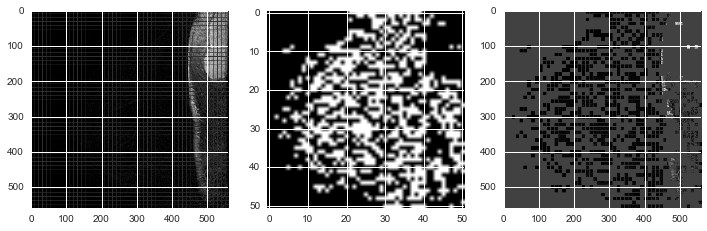

done plotting positives = 852
 
 Classifying slice no 1...
(2601L, 500L)


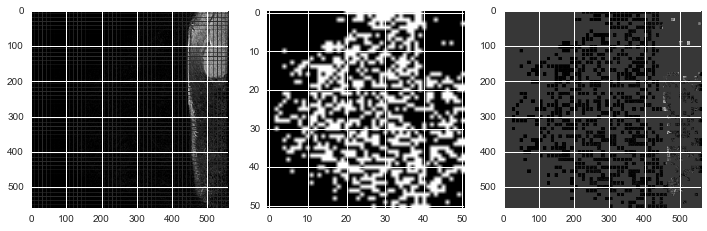

done plotting positives = 835
 
 Classifying slice no 2...
(2601L, 500L)


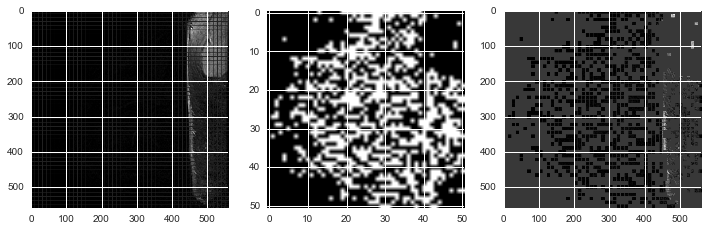

done plotting positives = 867
 
 Classifying slice no 3...
(2601L, 500L)


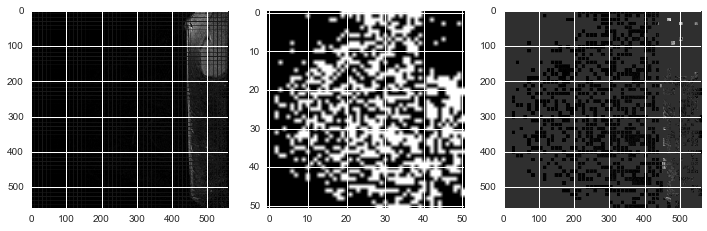

done plotting positives = 900
 
 Classifying slice no 4...
(2601L, 500L)


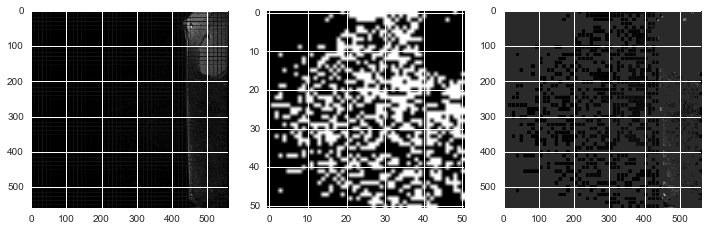

done plotting positives = 870
 
 Classifying slice no 5...
(2601L, 500L)


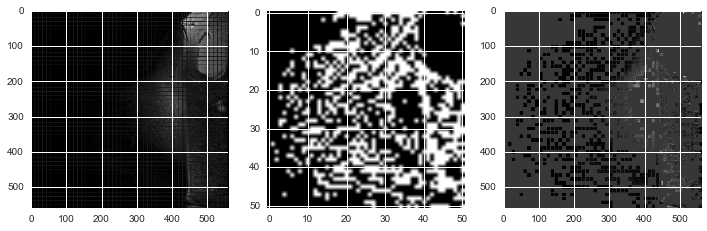

done plotting positives = 859
 
 Classifying slice no 6...
(2601L, 500L)


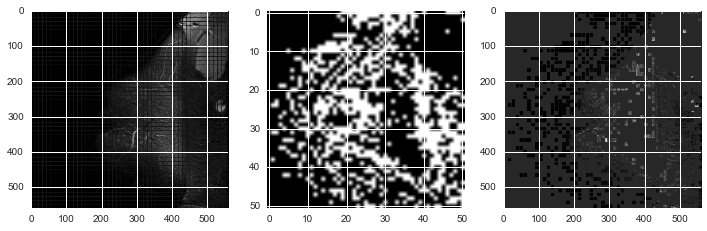

done plotting positives = 835
 
 Classifying slice no 7...
(2601L, 500L)


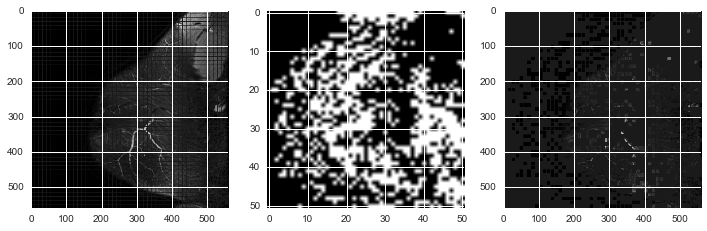

done plotting positives = 918
 
 Classifying slice no 8...
(2601L, 500L)


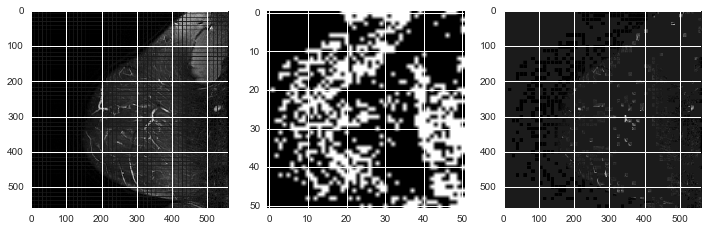

done plotting positives = 790
 
 Classifying slice no 9...
(2601L, 500L)


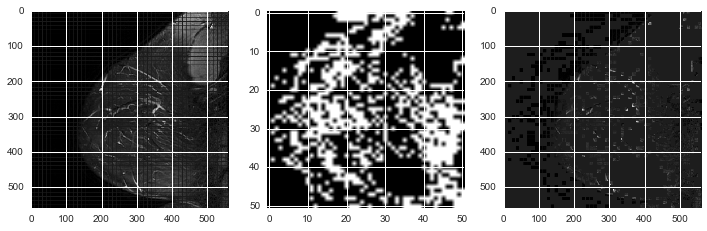

done plotting positives = 850
 
 Classifying slice no 10...
(2601L, 500L)


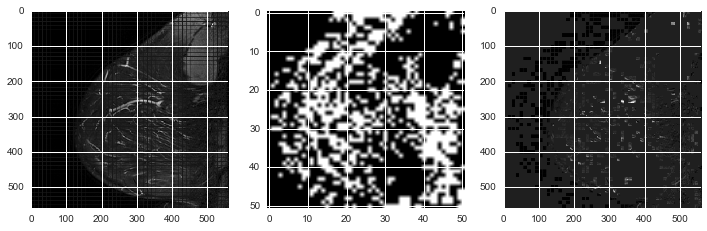

done plotting positives = 855
 
 Classifying slice no 11...
(2601L, 500L)


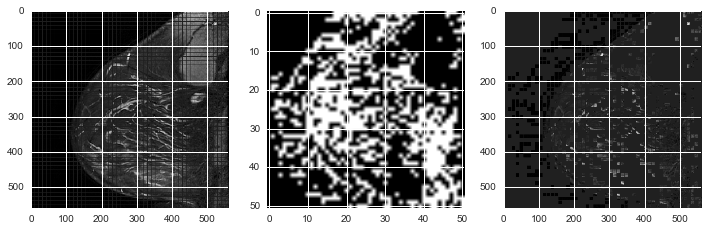

done plotting positives = 913
 
 Classifying slice no 12...
(2601L, 500L)


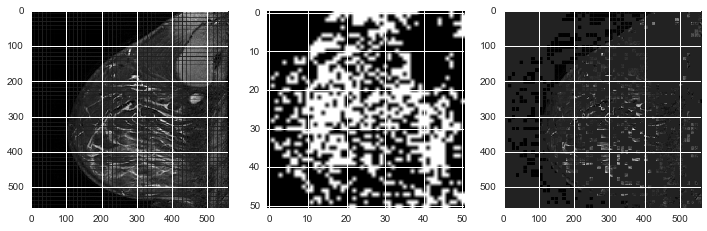

done plotting positives = 918
 
 Classifying slice no 13...
(2601L, 500L)


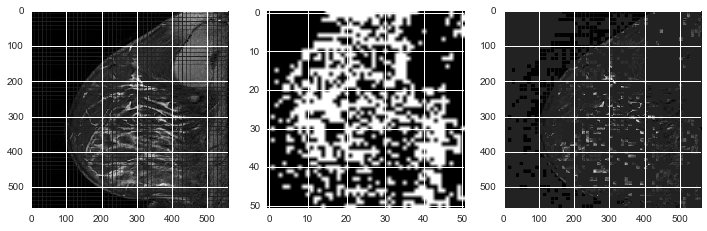

done plotting positives = 937
 
 Classifying slice no 14...
(2601L, 500L)


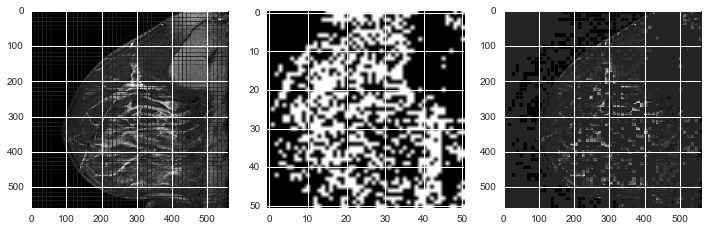

done plotting positives = 946
 
 Classifying slice no 15...
(2601L, 500L)


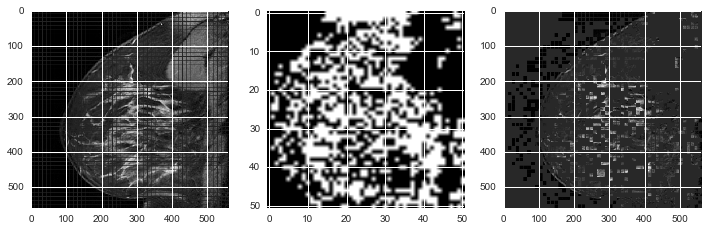

done plotting positives = 999
 
 Classifying slice no 16...
(2601L, 500L)


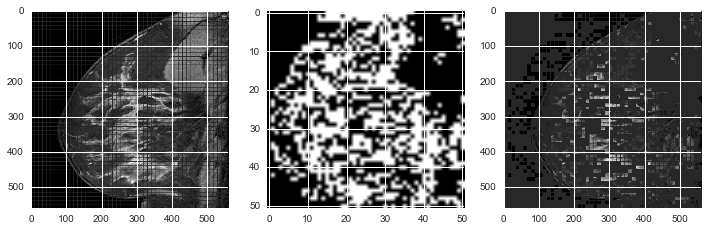

done plotting positives = 993
 
 Classifying slice no 17...
(2601L, 500L)


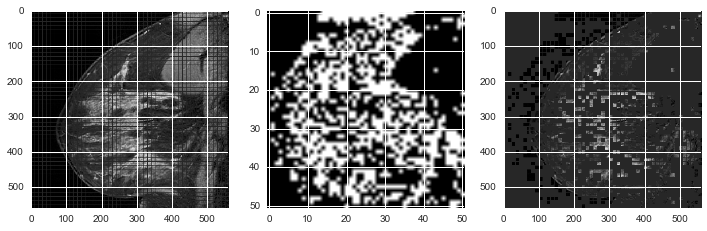

done plotting positives = 930
 
 Classifying slice no 18...
(2601L, 500L)


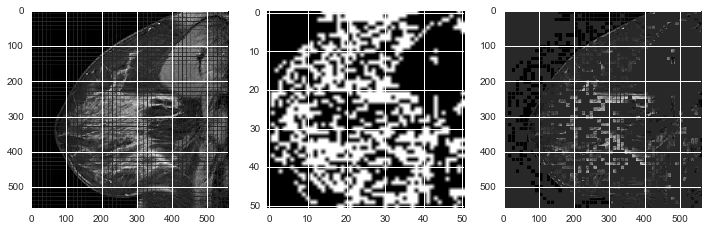

done plotting positives = 989
 
 Classifying slice no 19...
(2601L, 500L)


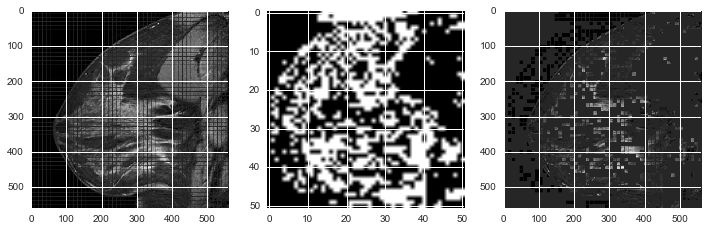

done plotting positives = 938
 
 Classifying slice no 20...
(2601L, 500L)


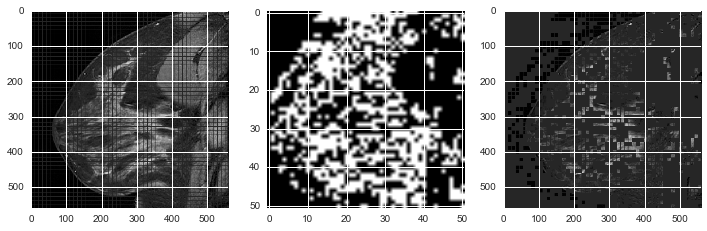

done plotting positives = 952
 
 Classifying slice no 21...
(2601L, 500L)


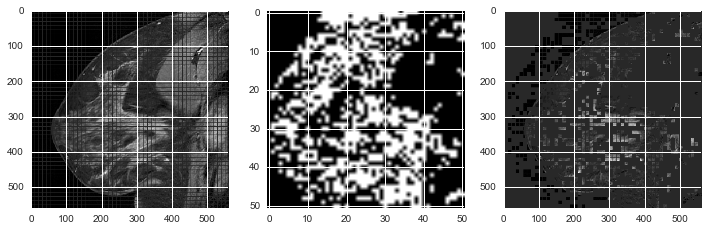

done plotting positives = 907
 
 Classifying slice no 22...
(2601L, 500L)


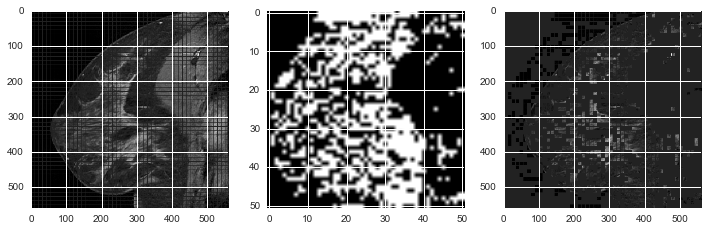

done plotting positives = 938
 
 Classifying slice no 23...
(2601L, 500L)


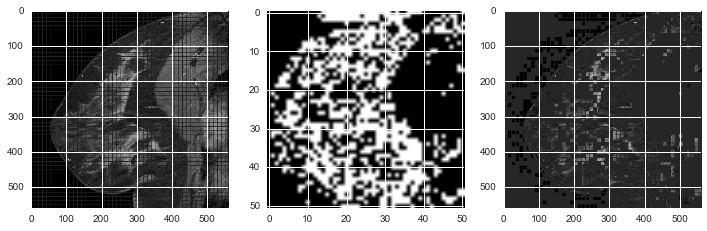

done plotting positives = 939
 
 Classifying slice no 24...
(2601L, 500L)


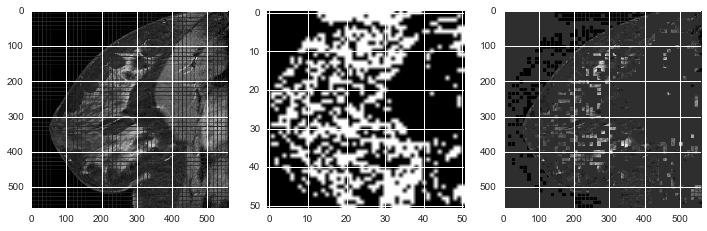

done plotting positives = 894
 
 Classifying slice no 25...
(2601L, 500L)


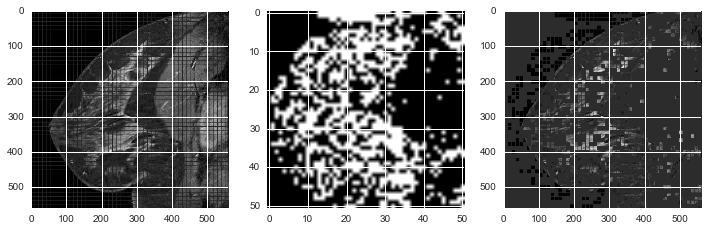

done plotting positives = 903
 
 Classifying slice no 26...
(2601L, 500L)


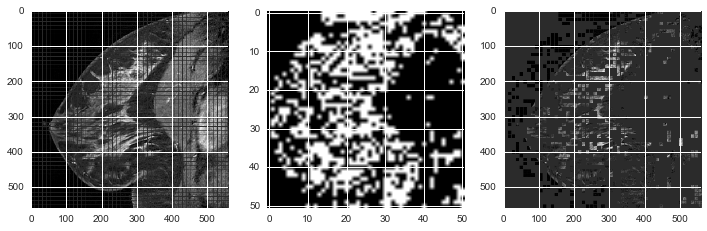

done plotting positives = 858
 
 Classifying slice no 27...
(2601L, 500L)


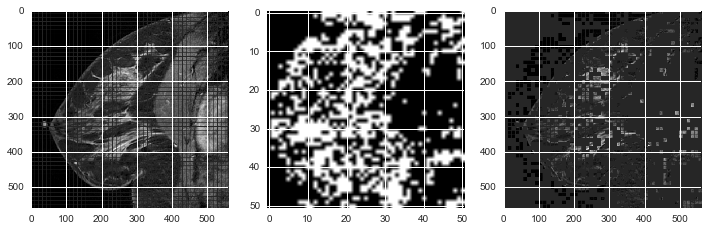

done plotting positives = 905
 
 Classifying slice no 28...
(2601L, 500L)


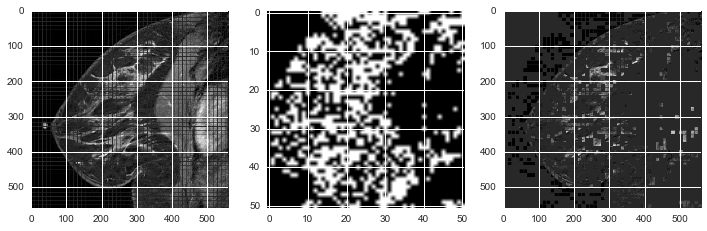

done plotting positives = 856
 
 Classifying slice no 29...
(2601L, 500L)


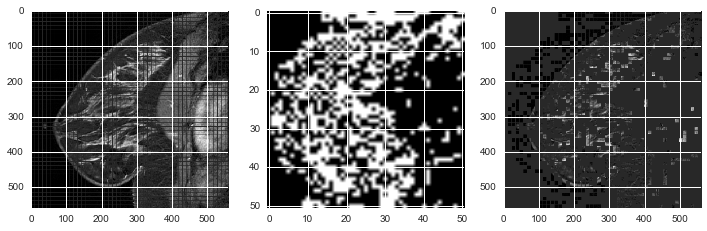

done plotting positives = 883
 
 Classifying slice no 30...
(2601L, 500L)


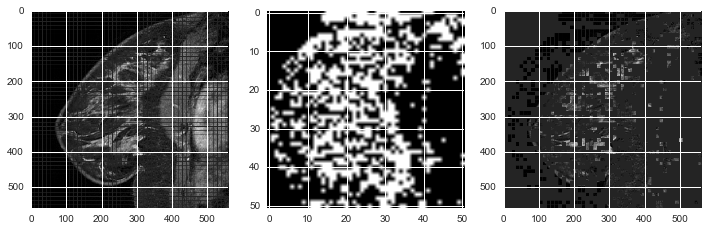

done plotting positives = 891
 
 Classifying slice no 31...
(2601L, 500L)


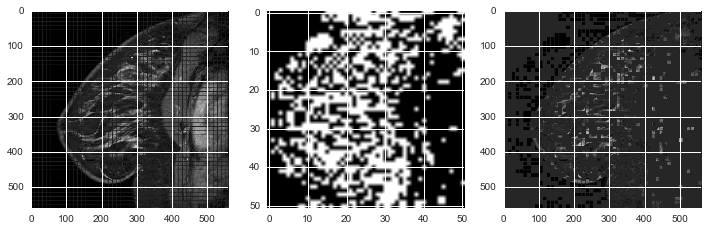

done plotting positives = 920
 
 Classifying slice no 32...
(2601L, 500L)


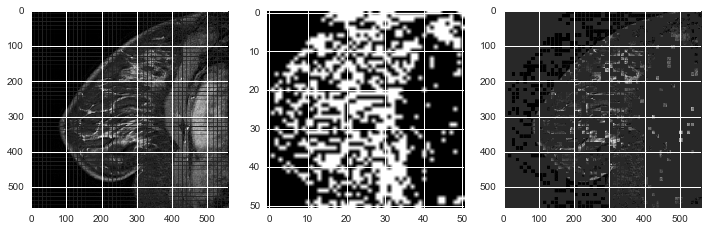

done plotting positives = 899
 
 Classifying slice no 33...
(2601L, 500L)


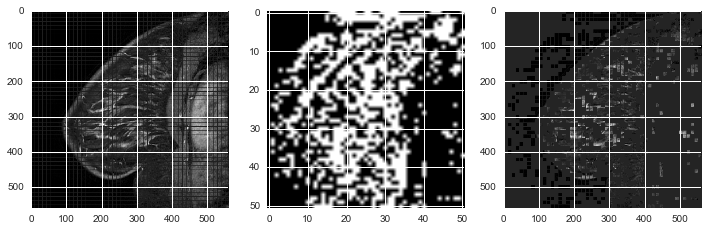

done plotting positives = 913
 
 Classifying slice no 34...
(2601L, 500L)


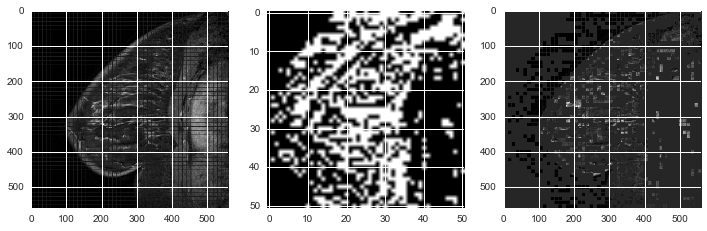

done plotting positives = 890
 
 Classifying slice no 35...
(2601L, 500L)


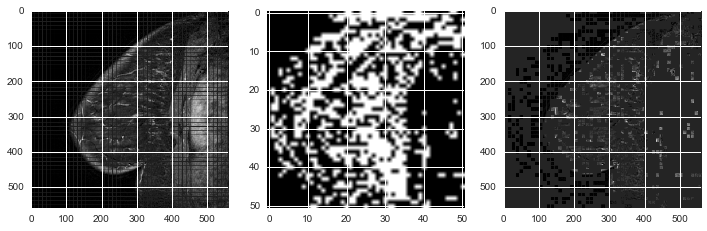

done plotting positives = 907
 
 Classifying slice no 36...
(2601L, 500L)


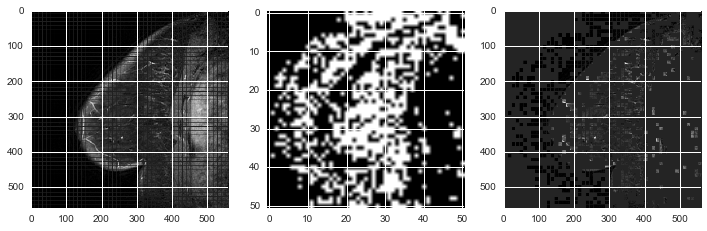

done plotting positives = 896
 
 Classifying slice no 37...
(2601L, 500L)


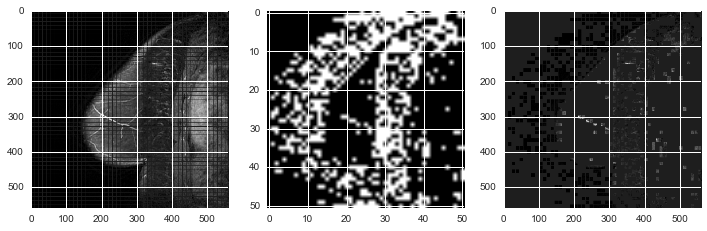

done plotting positives = 748
 
 Classifying slice no 38...
(2601L, 500L)


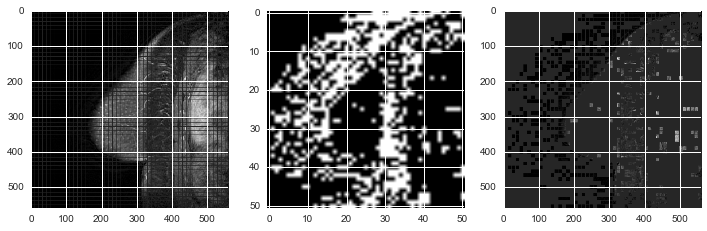

done plotting positives = 734
 
 Classifying slice no 39...
(2601L, 500L)


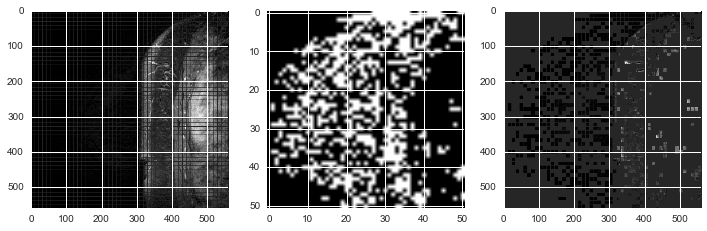

done plotting positives = 787
 
 Classifying slice no 40...
(2601L, 500L)


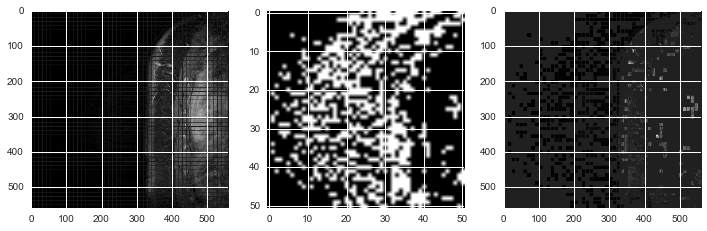

done plotting positives = 803
 
 Classifying slice no 41...
(2601L, 500L)


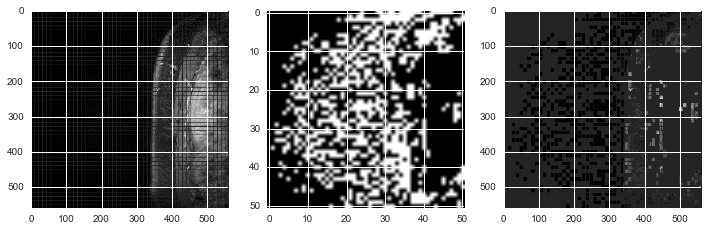

done plotting positives = 839
 
 Classifying slice no 42...
(2601L, 500L)


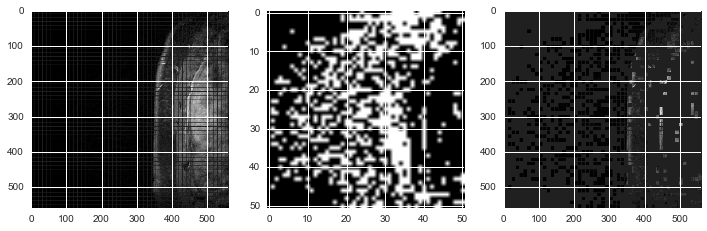

done plotting positives = 827
 
 Classifying slice no 43...
(2601L, 500L)


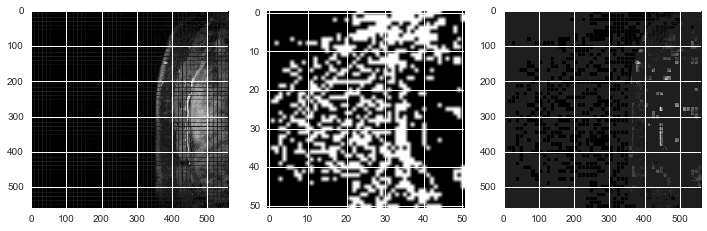

done plotting positives = 823
 
 Classifying slice no 44...
(2601L, 500L)


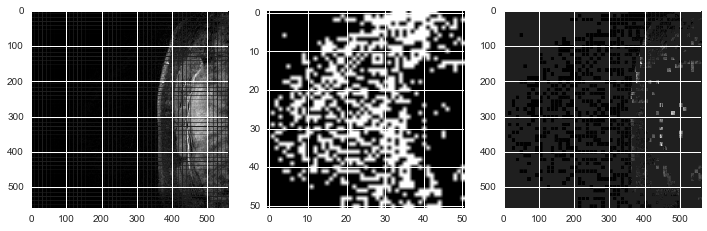

done plotting positives = 818
 
 Classifying slice no 45...
(2601L, 500L)


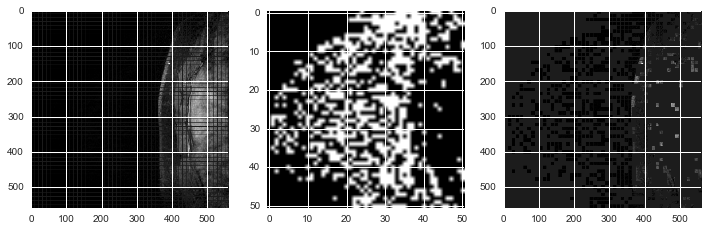

done plotting positives = 801
 
 Classifying slice no 46...
(2601L, 500L)


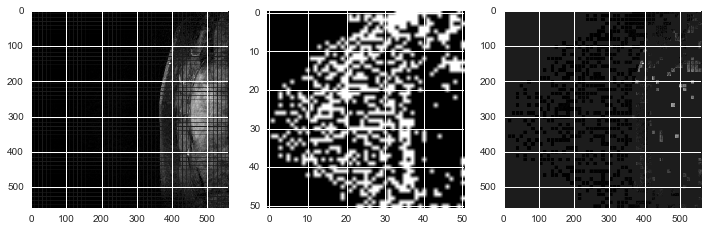

done plotting positives = 730
 
 Classifying slice no 47...
(2601L, 500L)


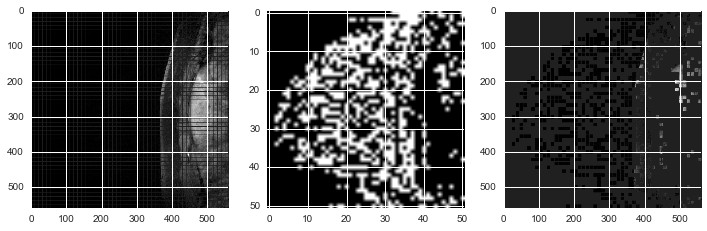

done plotting positives = 735
 
 Classifying slice no 48...
(2601L, 500L)


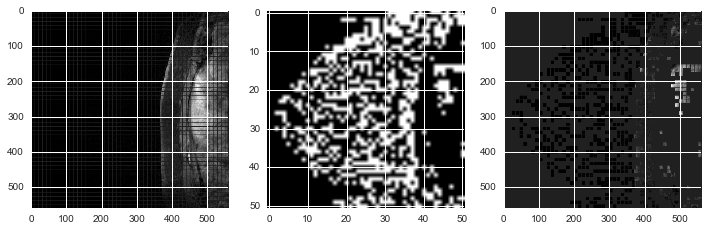

done plotting positives = 732
 
 Classifying slice no 49...
(2601L, 500L)


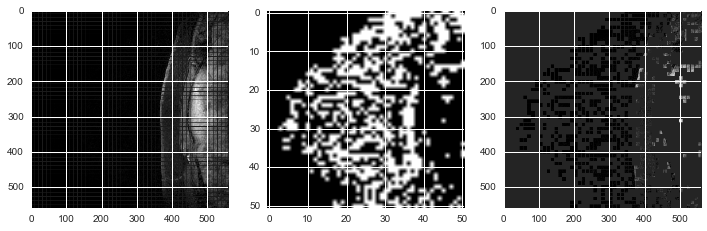

done plotting positives = 766
 
 Classifying slice no 50...
(2601L, 500L)


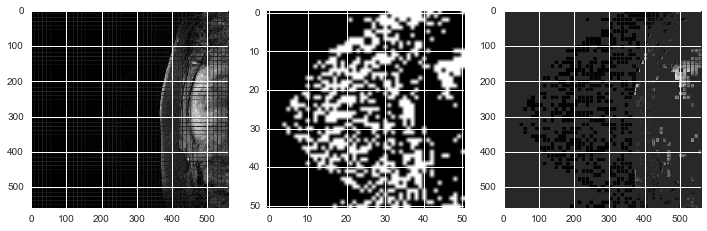

done plotting positives = 711
 
 Classifying slice no 51...
(2601L, 500L)


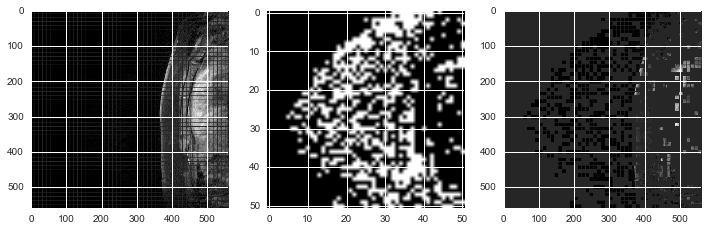

done plotting positives = 709
 
 Classifying slice no 52...
(2601L, 500L)


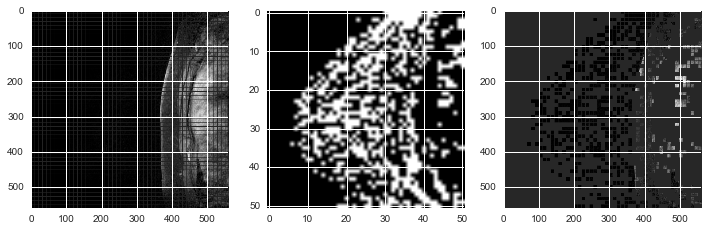

done plotting positives = 718
 
 Classifying slice no 53...
(2601L, 500L)


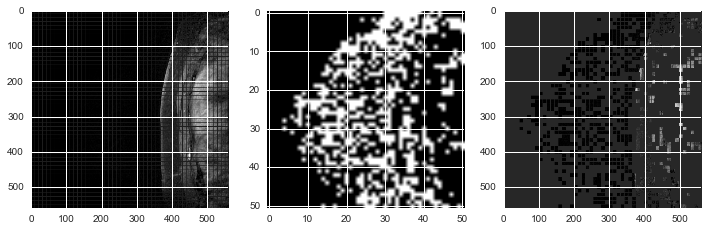

done plotting positives = 706
 
 Classifying slice no 54...
(2601L, 500L)


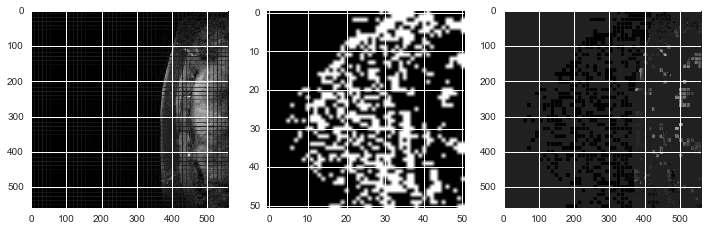

done plotting positives = 696
 
 Classifying slice no 55...
(2601L, 500L)


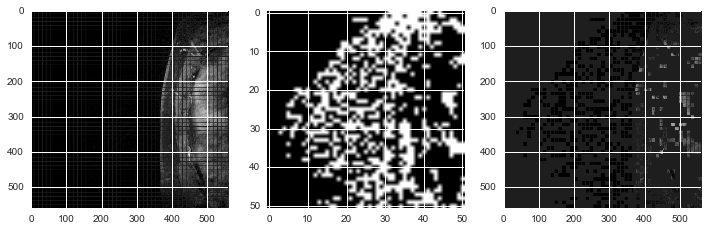

done plotting positives = 745
 
 Classifying slice no 56...
(2601L, 500L)


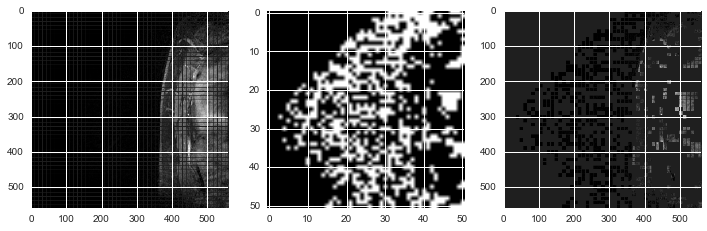

done plotting positives = 756
 
 Classifying slice no 57...
(2601L, 500L)


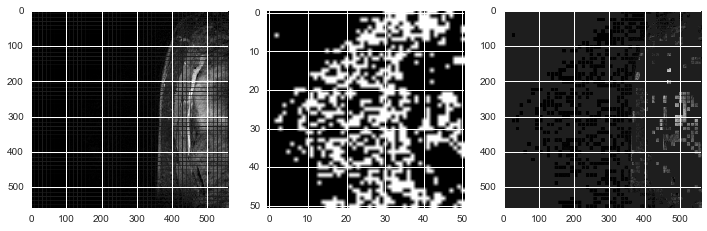

done plotting positives = 755
 
 Classifying slice no 58...
(2601L, 500L)


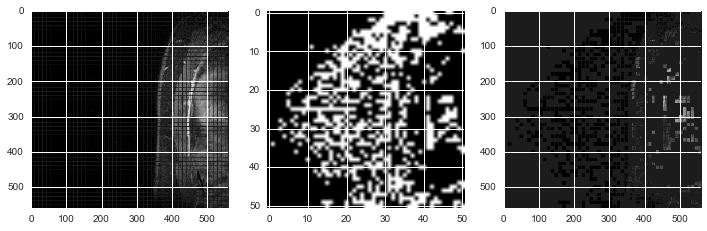

done plotting positives = 732
 
 Classifying slice no 59...
(2601L, 500L)


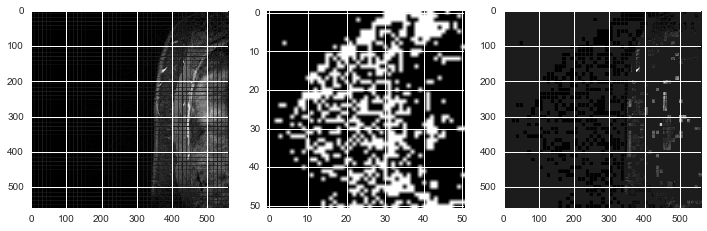

done plotting positives = 718
 
 Classifying slice no 60...
(2601L, 500L)


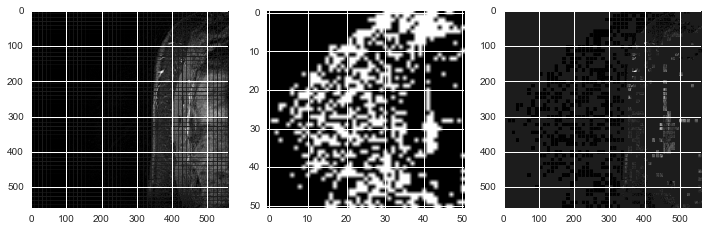

done plotting positives = 761
 
 Classifying slice no 61...
(2601L, 500L)


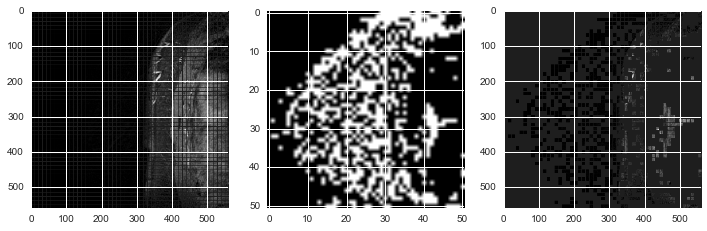

done plotting positives = 758
 
 Classifying slice no 62...
(2601L, 500L)


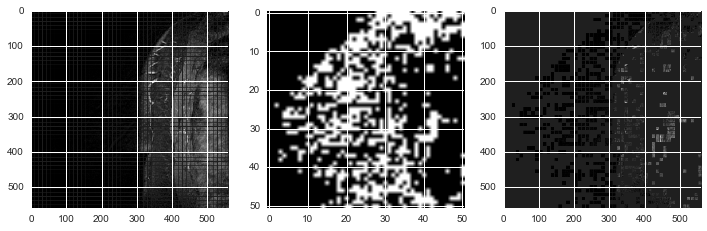

done plotting positives = 755
 
 Classifying slice no 63...
(2601L, 500L)


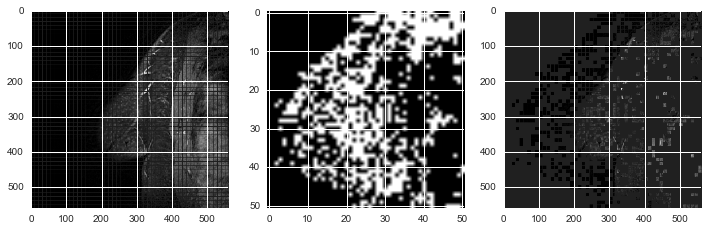

done plotting positives = 789
 
 Classifying slice no 64...
(2601L, 500L)


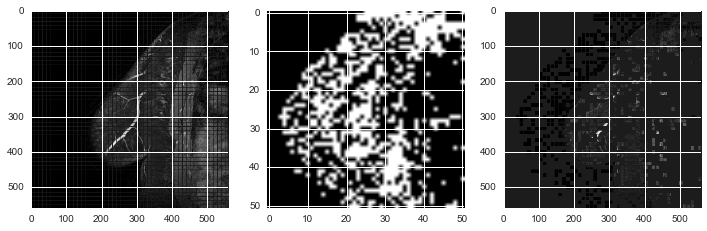

done plotting positives = 776
 
 Classifying slice no 65...
(2601L, 500L)


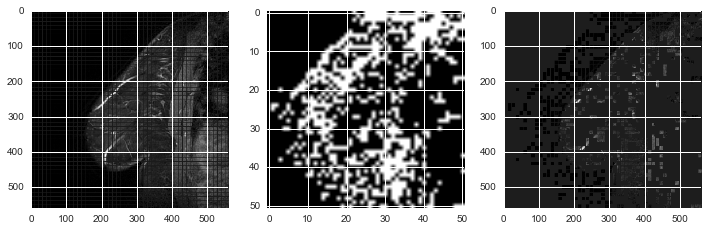

done plotting positives = 733
 
 Classifying slice no 66...
(2601L, 500L)


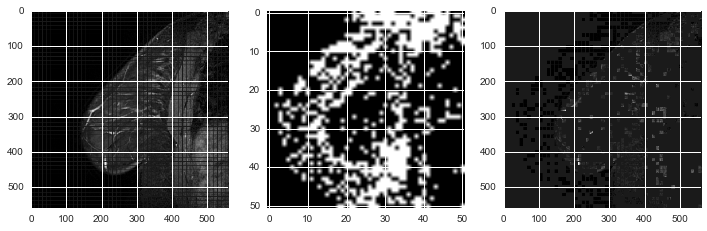

done plotting positives = 724
 
 Classifying slice no 67...
(2601L, 500L)


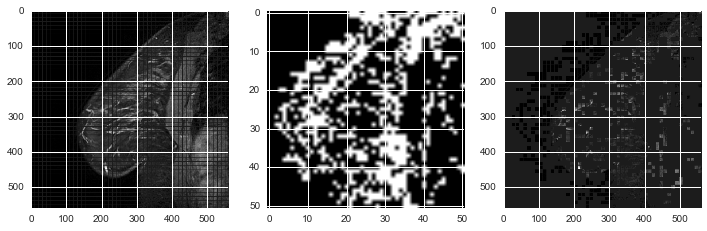

done plotting positives = 761
 
 Classifying slice no 68...
(2601L, 500L)


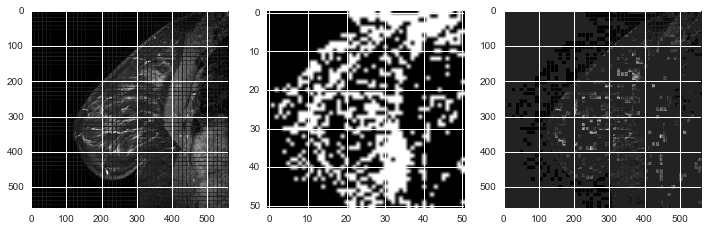

done plotting positives = 812
 
 Classifying slice no 69...
(2601L, 500L)


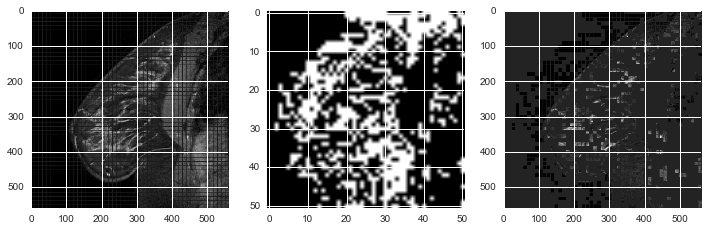

done plotting positives = 803
 
 Classifying slice no 70...
(2601L, 500L)


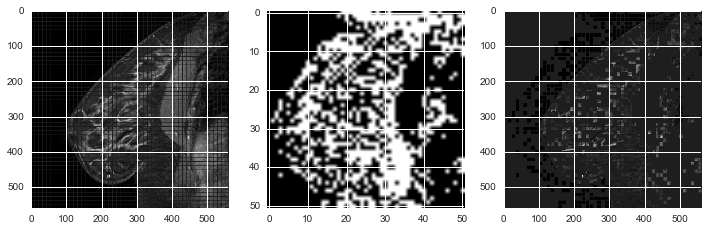

done plotting positives = 904
 
 Classifying slice no 71...
(2601L, 500L)


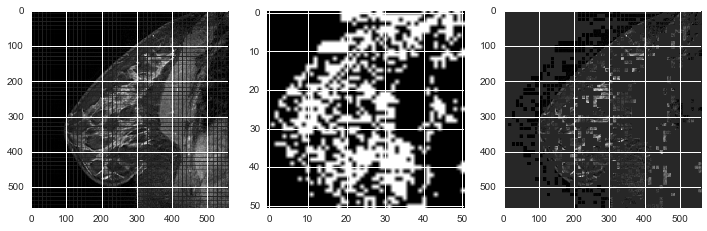

done plotting positives = 863
 
 Classifying slice no 72...
(2601L, 500L)


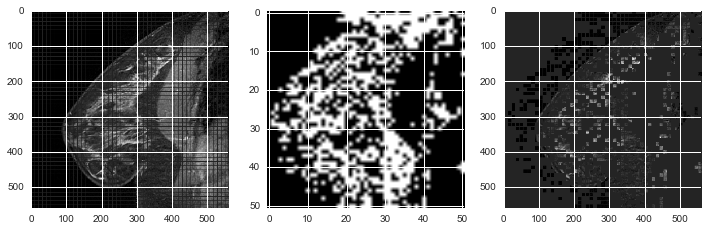

done plotting positives = 835
 
 Classifying slice no 73...
(2601L, 500L)


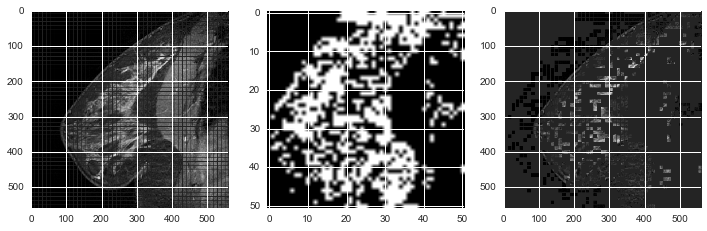

done plotting positives = 839
 
 Classifying slice no 74...
(2601L, 500L)


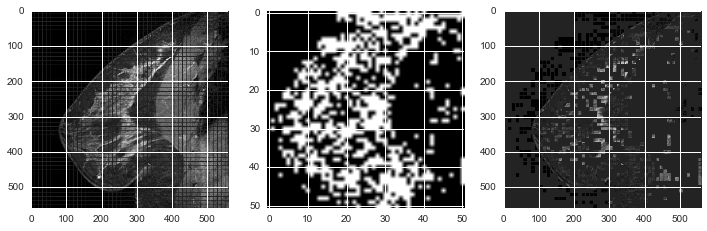

done plotting positives = 830
 
 Classifying slice no 75...
(2601L, 500L)


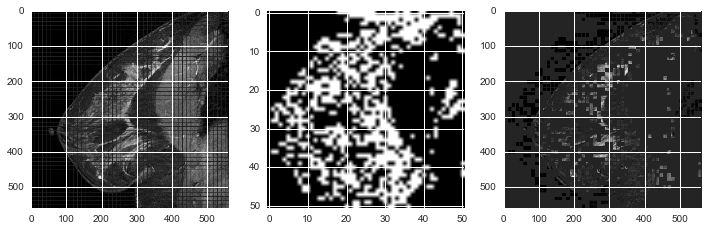

done plotting positives = 805
 
 Classifying slice no 76...
(2601L, 500L)


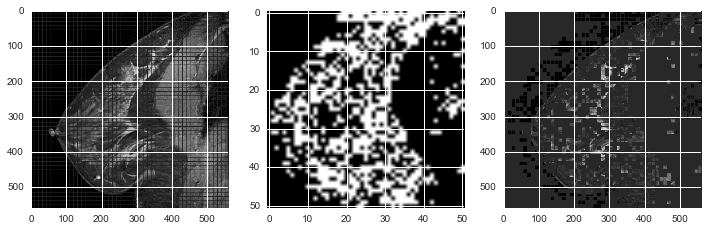

done plotting positives = 827
 
 Classifying slice no 77...
(2601L, 500L)


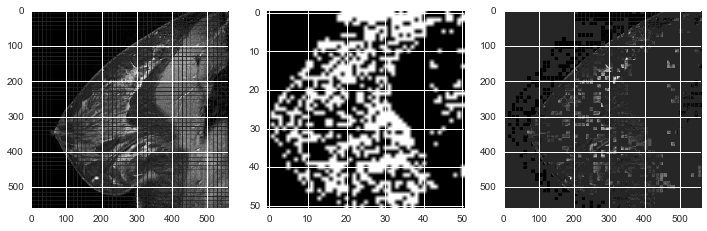

done plotting positives = 830
 
 Classifying slice no 78...
(2601L, 500L)


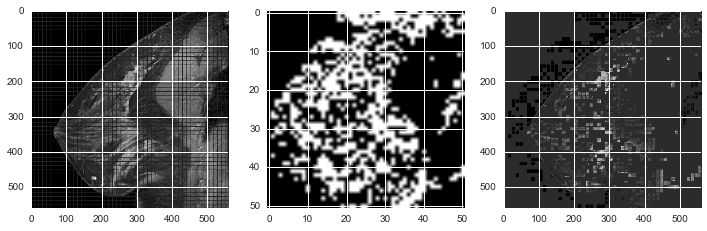

done plotting positives = 814
 
 Classifying slice no 79...
(2601L, 500L)


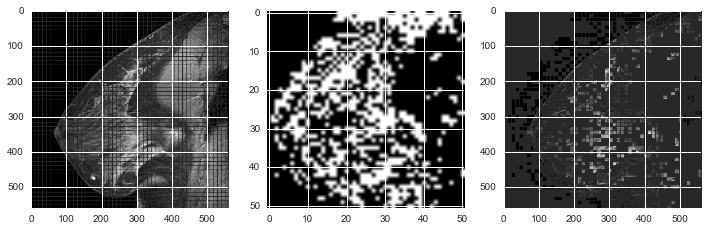

done plotting positives = 814
 
 Classifying slice no 80...
(2601L, 500L)


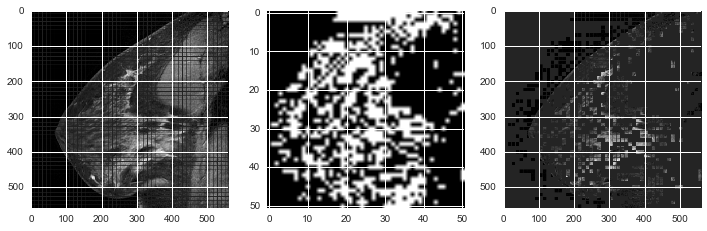

done plotting positives = 831
 
 Classifying slice no 81...
(2601L, 500L)


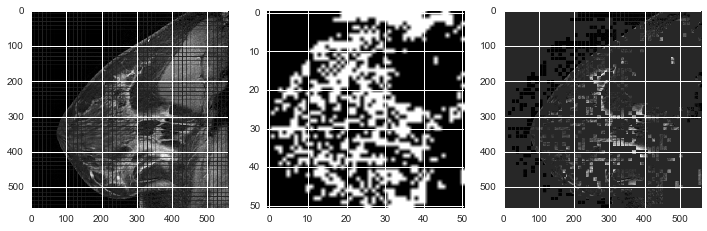

done plotting positives = 844
 
 Classifying slice no 82...
(2601L, 500L)


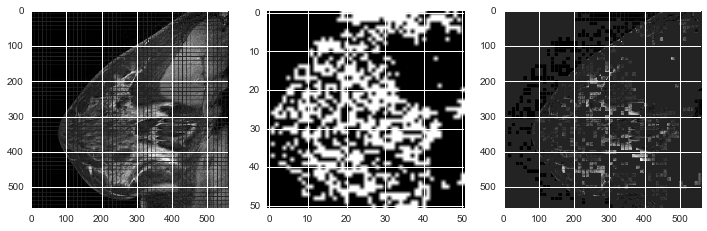

done plotting positives = 874
 
 Classifying slice no 83...
(2601L, 500L)


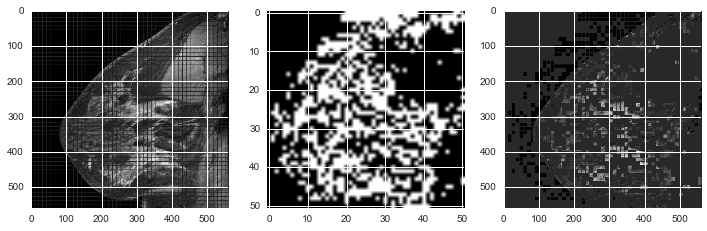

done plotting positives = 894
 
 Classifying slice no 84...
(2601L, 500L)


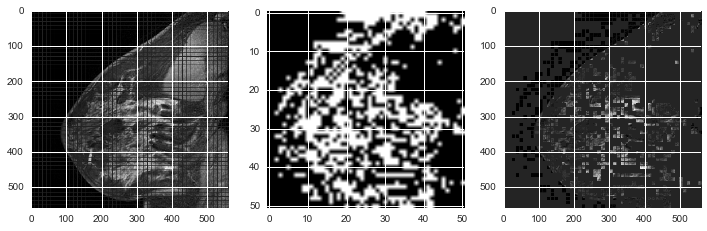

done plotting positives = 840
 
 Classifying slice no 85...
(2601L, 500L)


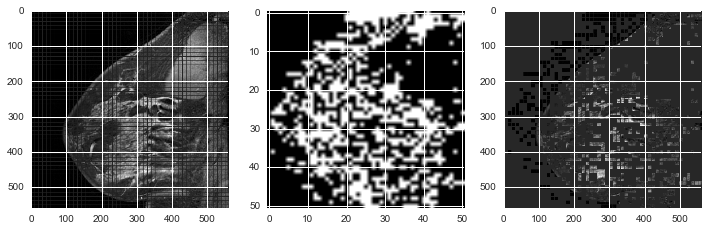

done plotting positives = 831
 
 Classifying slice no 86...
(2601L, 500L)


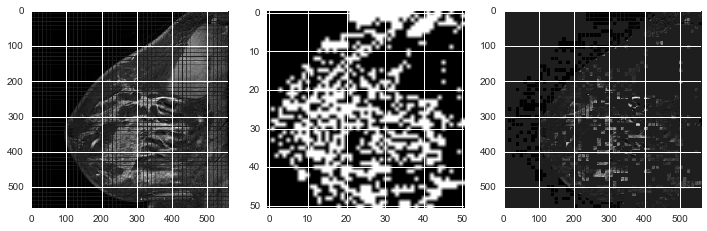

done plotting positives = 855
 
 Classifying slice no 87...
(2601L, 500L)


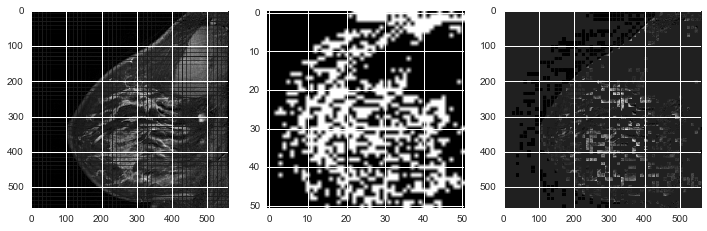

done plotting positives = 855
 
 Classifying slice no 88...
(2601L, 500L)


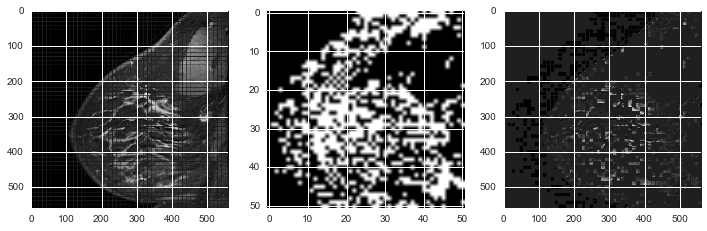

done plotting positives = 852
 
 Classifying slice no 89...
(2601L, 500L)


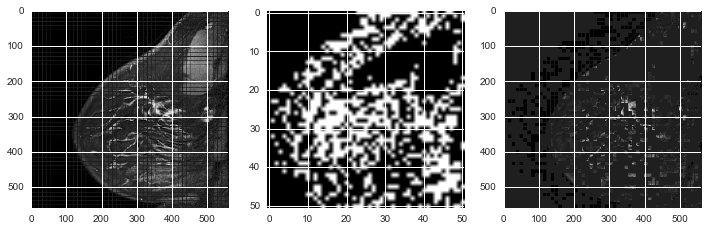

done plotting positives = 825
 
 Classifying slice no 90...
(2601L, 500L)


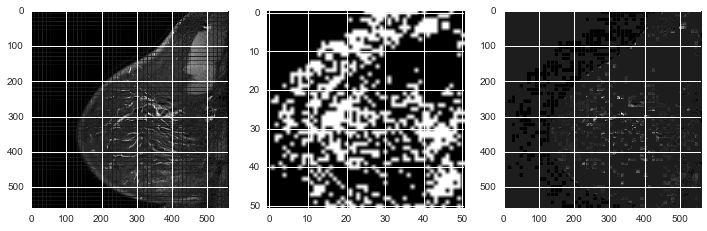

done plotting positives = 791
 
 Classifying slice no 91...
(2601L, 500L)


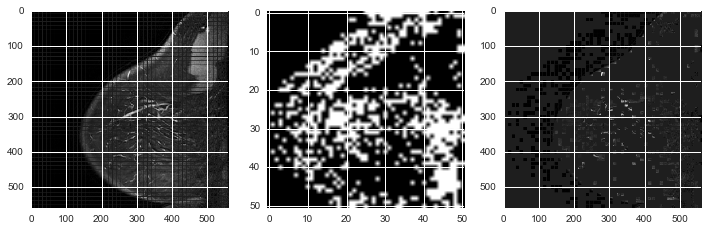

done plotting positives = 745
 
 Classifying slice no 92...
(2601L, 500L)


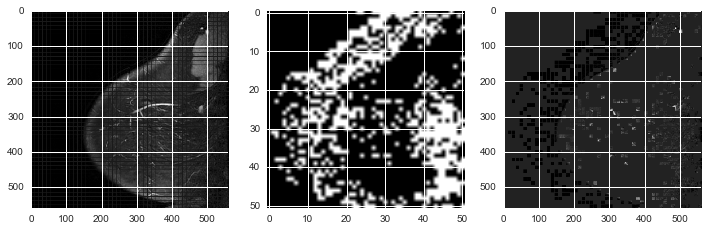

done plotting positives = 721
 
 Classifying slice no 93...
(2601L, 500L)


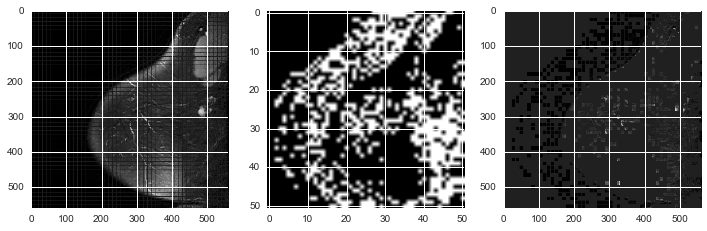

done plotting positives = 759
 
 Classifying slice no 94...
(2601L, 500L)


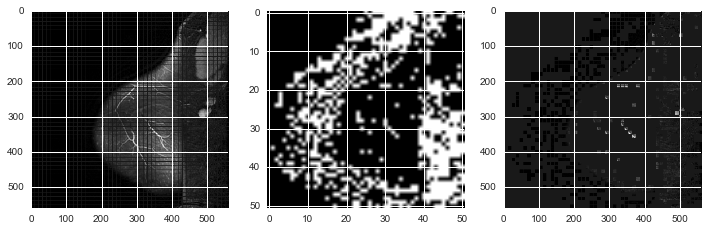

done plotting positives = 724
 
 Classifying slice no 95...
(2601L, 500L)


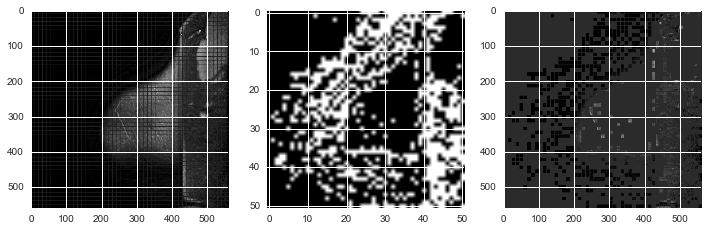

done plotting positives = 789
 
 Classifying slice no 96...
(2601L, 500L)


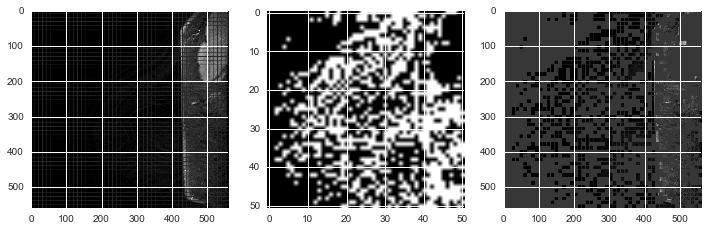

done plotting positives = 957
 
 Classifying slice no 97...
(2601L, 500L)


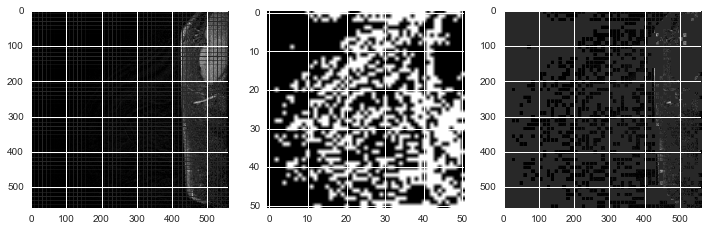

done plotting positives = 955
 
 Classifying slice no 98...
(2601L, 500L)


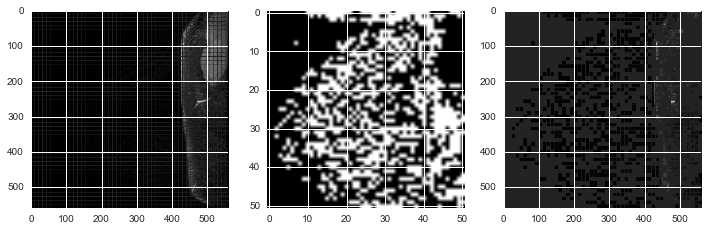

done plotting positives = 912
 
 Classifying slice no 99...
(2601L, 500L)


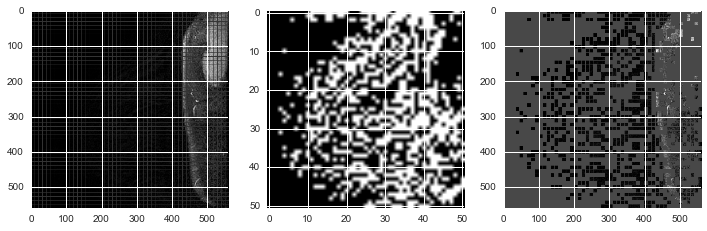

done plotting positives = 913
100


In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
%run run_dicompatches2roi.py